**Project Title**

ResQRelief: Integrated Disaster Impact Prediction and Response Management System


> Add blockquote



**Problem Statement**

Disasters such as floods, earthquakes, and cyclones cause large-scale damage to lives, infrastructure, and the economy. The major challenge during these events is not only predicting when and how severe they will be, but also managing the response effectively to reduce losses and support faster recovery.  

Most existing projects focus on a single type of disaster, which limits their usefulness.  
There is a need for an integrated system that can analyze different disaster datasets, predict potential impacts, and provide insights to support timely, data-driven decision-making for response and resource management.


**Description**

ResQRelief uses disaster-related datasets (starting with flood impact data) to build predictive models that estimate the severity and consequences of disasters.  
By analyzing historical patterns and contextual factors, the system can guide emergency preparedness, resource allocation, and response planning.  
While the initial focus is on floods, the framework is designed to extend to other disasters such as earthquakes and cyclones.


## Week 1



In [ ]:
#Importing Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#ML related imports

#Model Selection
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

#Preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder

#Models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

#Metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, mean_squared_error, r2_score

#Save Models
import joblib

In [ ]:
#Load Disaster(Flood) Datasets

flood_data =pd.read_csv("flood.csv")
categories_data = pd.read_csv("disaster_categories.csv")
messages_data = pd.read_csv("disaster_messages.csv", engine='python', on_bad_lines='skip')
census_data = pd.read_csv("india-districts-census-2011.csv")  # Make sure file name matches

#display first few rows
print("Flood Data:")
print(flood_data.head(),"\n")

print("Disaster Categories Data:")
print(categories_data.head(), "\n")

print("Disaster Messages Data:")
print(messages_data.head(), "\n")

print("Census/Population Data:")
print(census_data.head(), "\n")

Flood Data:
   MonsoonIntensity  TopographyDrainage  RiverManagement  Deforestation  \
0                 3                   8                6              6   
1                 8                   4                5              7   
2                 3                  10                4              1   
3                 4                   4                2              7   
4                 3                   7                5              2   

   Urbanization  ClimateChange  DamsQuality  Siltation  AgriculturalPractices  \
0             4              4            6          2                      3   
1             7              9            1          5                      5   
2             7              5            4          7                      4   
3             3              4            1          4                      6   
4             5              8            5          2                      7   

   Encroachments  ...  DrainageSystems  CoastalVul

In [ ]:
import os
print(os.getcwd())


/content


In [ ]:
#Flood Data
print("Flood Data Info:")
print(flood_data.info(), "\n")
print("Flood Data Description:")
print(flood_data.describe(), "\n")
print("Flood Data Missing Values:")
print(flood_data.isnull().sum(), "\n")


Flood Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   MonsoonIntensity                 50000 non-null  int64  
 1   TopographyDrainage               50000 non-null  int64  
 2   RiverManagement                  50000 non-null  int64  
 3   Deforestation                    50000 non-null  int64  
 4   Urbanization                     50000 non-null  int64  
 5   ClimateChange                    50000 non-null  int64  
 6   DamsQuality                      50000 non-null  int64  
 7   Siltation                        50000 non-null  int64  
 8   AgriculturalPractices            50000 non-null  int64  
 9   Encroachments                    50000 non-null  int64  
 10  IneffectiveDisasterPreparedness  50000 non-null  int64  
 11  DrainageSystems                  50000 non-null  int64  
 12  C

In [ ]:
#Disaster Categories Data
print("Disaster Categories Data Info:")
print(categories_data.info(), "\n")
print("Disaster Categories Data Description:")
print(categories_data.describe(), "\n")
print("Disaster Categories Data Missing Values:")
print(categories_data.isnull().sum(), "\n")


Disaster Categories Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26248 entries, 0 to 26247
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          26248 non-null  int64 
 1   categories  26248 non-null  object
dtypes: int64(1), object(1)
memory usage: 410.3+ KB
None 

Disaster Categories Data Description:
                 id
count  26248.000000
mean   15224.078368
std     8826.069156
min        2.000000
25%     7445.750000
50%    15660.500000
75%    22923.250000
max    30265.000000 

Disaster Categories Data Missing Values:
id            0
categories    0
dtype: int64 



In [ ]:
# --- Disaster Messages Data ---
print("Disaster Messages Data Info:")
print(messages_data.info(), "\n")
print("Disaster Messages Data Description:")
print(messages_data.describe(), "\n")
print("Disaster Messages Data Missing Values:")
print(messages_data.isnull().sum(), "\n")

Disaster Messages Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26248 entries, 0 to 26247
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        26248 non-null  int64 
 1   message   26248 non-null  object
 2   original  10184 non-null  object
 3   genre     26248 non-null  object
dtypes: int64(1), object(3)
memory usage: 820.4+ KB
None 

Disaster Messages Data Description:
                 id
count  26248.000000
mean   15224.078368
std     8826.069156
min        2.000000
25%     7445.750000
50%    15660.500000
75%    22923.250000
max    30265.000000 

Disaster Messages Data Missing Values:
id              0
message         0
original    16064
genre           0
dtype: int64 



In [ ]:
# --- Census/Population Data ---
print("Census Data Info:")
print(census_data.info(), "\n")
print("Census Data Description:")
print(census_data.describe(), "\n")
print("Census Data Missing Values:")
print(census_data.isnull().sum(), "\n")

Census Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Columns: 118 entries, District code to Total_Power_Parity
dtypes: int64(116), object(2)
memory usage: 590.1+ KB
None 

Census Data Description:
       District code    Population          Male        Female      Literate  \
count     640.000000  6.400000e+02  6.400000e+02  6.400000e+02  6.400000e+02   
mean      320.500000  1.891961e+06  9.738598e+05  9.181011e+05  1.193186e+06   
std       184.896367  1.544380e+06  8.007785e+05  7.449864e+05  1.068583e+06   
min         1.000000  8.004000e+03  4.414000e+03  3.590000e+03  4.436000e+03   
25%       160.750000  8.178610e+05  4.171682e+05  4.017458e+05  4.825982e+05   
50%       320.500000  1.557367e+06  7.986815e+05  7.589200e+05  9.573465e+05   
75%       480.250000  2.583551e+06  1.338604e+06  1.264277e+06  1.602260e+06   
max       640.000000  1.106015e+07  5.865078e+06  5.195070e+06  8.227161e+06   

       Male_Literate  Female_Literate        

## Week 2: Exploratory Data Analysis (EDA), Data Transformation, and Feature Selection

### Messages Data Transformation

In [ ]:
# --- Merge messages and categories datasets ---
df_messages_combined = messages_data.merge(categories_data, on='id')
print("Combined Messages & Categories Data Info:")
df_messages_combined.info()
print("\nCombined Messages & Categories Data Head:")
print(df_messages_combined.head())

# --- Transform the 'categories' column into multiple binary columns ---
# Split the categories column by semicolon
categories_split = df_messages_combined['categories'].str.split(';', expand=True)

# Create new column names from the first row of categories_split
row = categories_split.iloc[0]
category_colnames = row.apply(lambda x: x[:-2])
categories_split.columns = category_colnames

# Convert each new column to a binary integer (0 or 1)
for column in categories_split:
    # Extract the last character and convert to integer, coercing errors to NaN
    categories_split[column] = pd.to_numeric(categories_split[column].str[-1], errors='coerce')
    # Fill NaN values with 0
    categories_split[column] = categories_split[column].fillna(0).astype(int)


# Drop the original 'categories' column from the combined dataframe
df_messages_combined.drop('categories', axis=1, inplace=True)

# Concatenate the new binary columns to the combined dataframe
df_messages_final = pd.concat([df_messages_combined, categories_split], axis=1)

print("\nFinal Transformed Messages Data Info:")
df_messages_final.info()
print("\nFinal Transformed Messages Data Head:")
print(df_messages_final.head())

Combined Messages & Categories Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26386 entries, 0 to 26385
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          26386 non-null  int64 
 1   message     26386 non-null  object
 2   original    10246 non-null  object
 3   genre       26386 non-null  object
 4   categories  26386 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.0+ MB

Combined Messages & Categories Data Head:
   id                                            message  \
0   2  Weather update - a cold front from Cuba that c...   
1   7            Is the Hurricane over or is it not over   
2   8                    Looking for someone but no name   
3   9  UN reports Leogane 80-90 destroyed. Only Hospi...   
4  12  says: west side of Haiti, rest of the country ...   

                                            original   genre  \
0  Un front froid se retrouve sur Cuba ce matin. ...

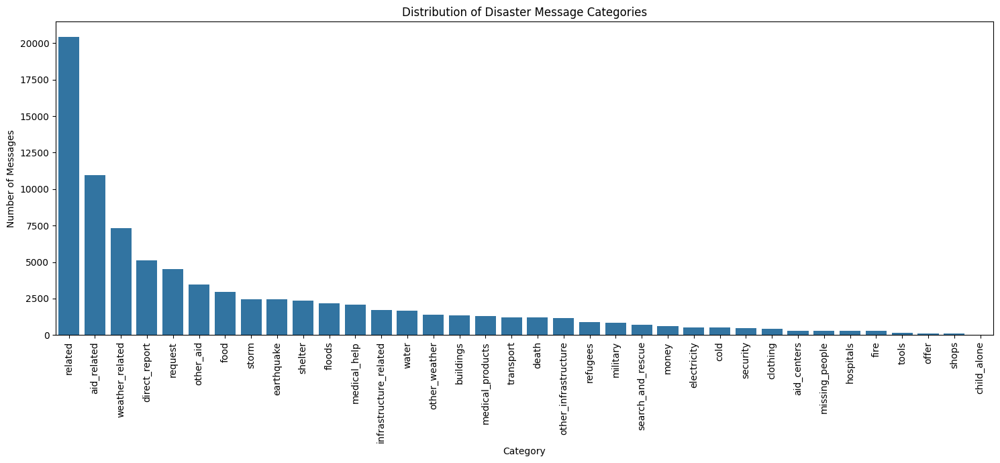

In [ ]:
# --- EDA for Transformed Message Data ---
# Count the number of messages for each category
category_counts = df_messages_final.iloc[:, 4:].sum().sort_values(ascending=False)

# Plot a bar chart to visualize the distribution of categories
plt.figure(figsize=(15, 7))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.title('Distribution of Disaster Message Categories')
plt.xlabel('Category')
plt.ylabel('Number of Messages')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Flood Data

Flood Data Shape: (50000, 21)
Flood Data Columns: ['MonsoonIntensity', 'TopographyDrainage', 'RiverManagement', 'Deforestation', 'Urbanization', 'ClimateChange', 'DamsQuality', 'Siltation', 'AgriculturalPractices', 'Encroachments', 'IneffectiveDisasterPreparedness', 'DrainageSystems', 'CoastalVulnerability', 'Landslides', 'Watersheds', 'DeterioratingInfrastructure', 'PopulationScore', 'WetlandLoss', 'InadequatePlanning', 'PoliticalFactors', 'FloodProbability']


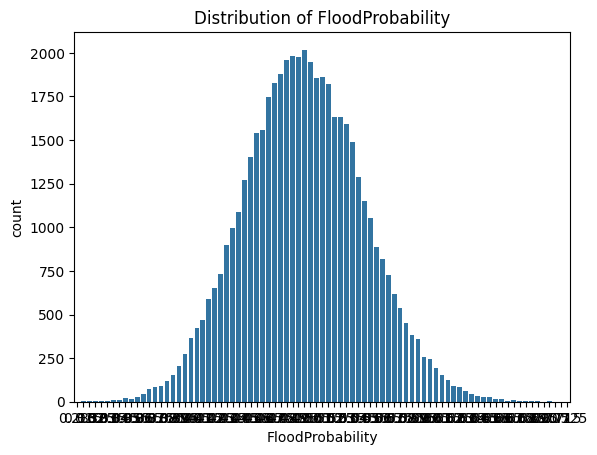

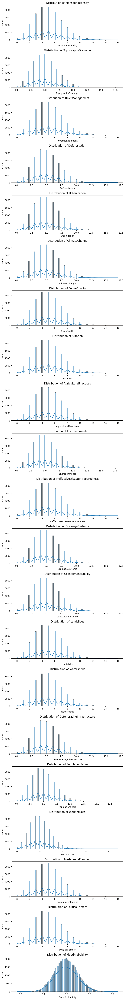

In [ ]:
# Flood Data Shape and Columns
print("Flood Data Shape:", flood_data.shape)
print("Flood Data Columns:", flood_data.columns.tolist())

# Univariate analysis for Flood Data

target_col = "FloodProbability"  # Corrected target column

# Countplot for target column
sns.countplot(data=flood_data, x=target_col)
plt.title(f"Distribution of {target_col}")
plt.show()

# Histograms for all numeric columns
num_cols = flood_data.select_dtypes(include=np.number).columns

fig, axes = plt.subplots(len(num_cols), 1, figsize=(8, len(num_cols) * 3))

for ax, col in zip(axes, num_cols):
    sns.histplot(flood_data[col], kde=True, ax=ax)
    ax.set_title(f"Distribution of {col}")

plt.tight_layout()
plt.show()


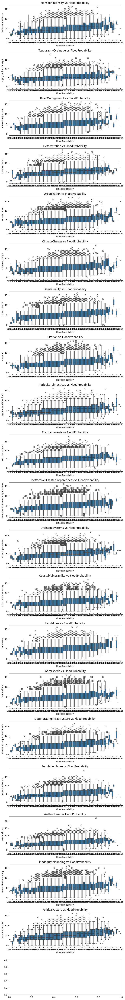

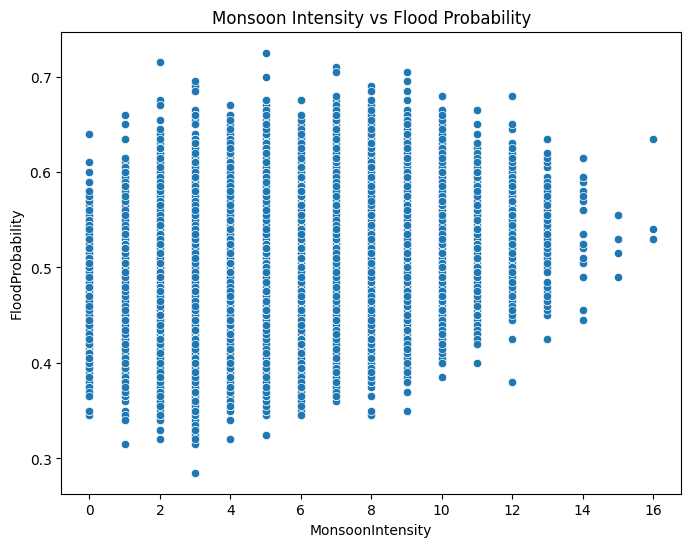

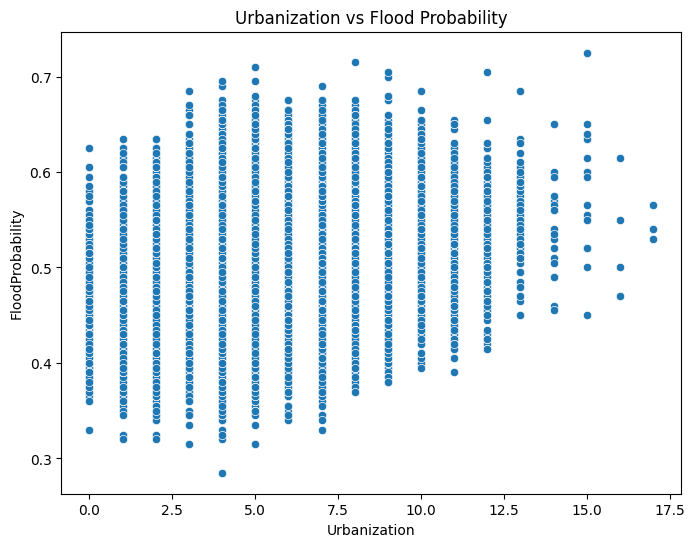

In [ ]:
# Bivariate Analysis for Flood Data

# Boxplot: Relationship of each numeric feature with FloodProbability
fig, axes = plt.subplots(len(num_cols), 1, figsize=(8, len(num_cols) * 3))

for ax, col in zip(axes, num_cols):
    if col != "FloodProbability":  # skip target column
        sns.boxplot(data=flood_data, x="FloodProbability", y=col, ax=ax)
        ax.set_title(f"{col} vs FloodProbability")

plt.tight_layout()
plt.show()

# Scatter plots: Example relationship between two important features
plt.figure(figsize=(8,6))
sns.scatterplot(data=flood_data, x="MonsoonIntensity", y="FloodProbability")
plt.title("Monsoon Intensity vs Flood Probability")
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(data=flood_data, x="Urbanization", y="FloodProbability")
plt.title("Urbanization vs Flood Probability")
plt.show()


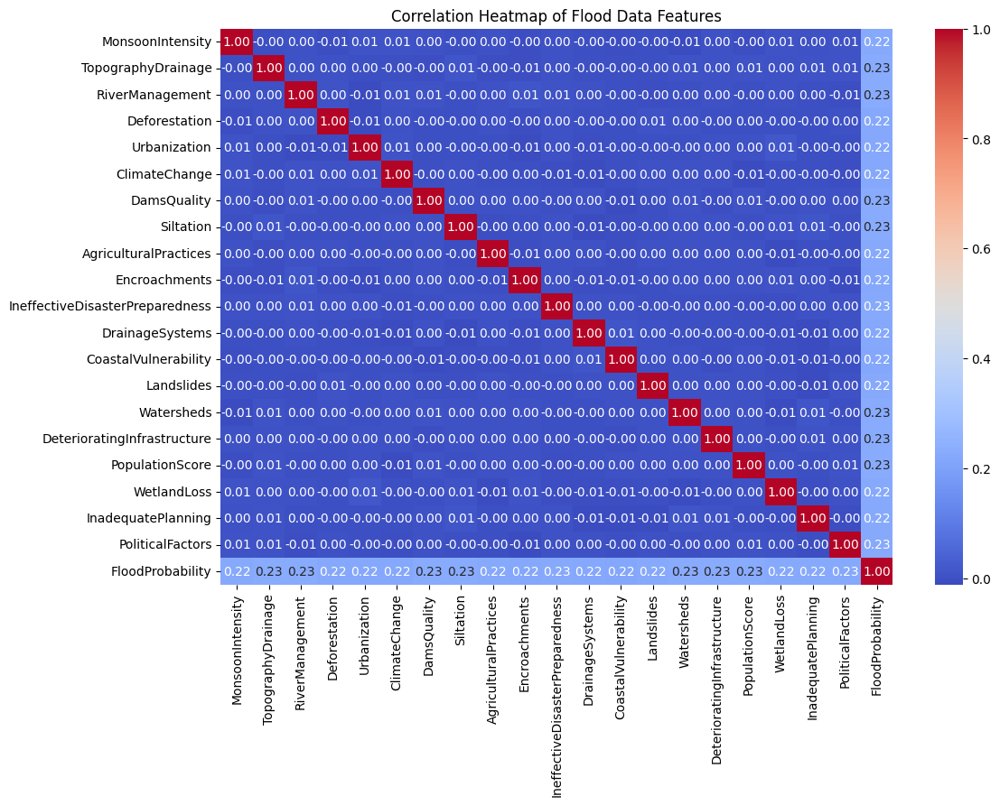

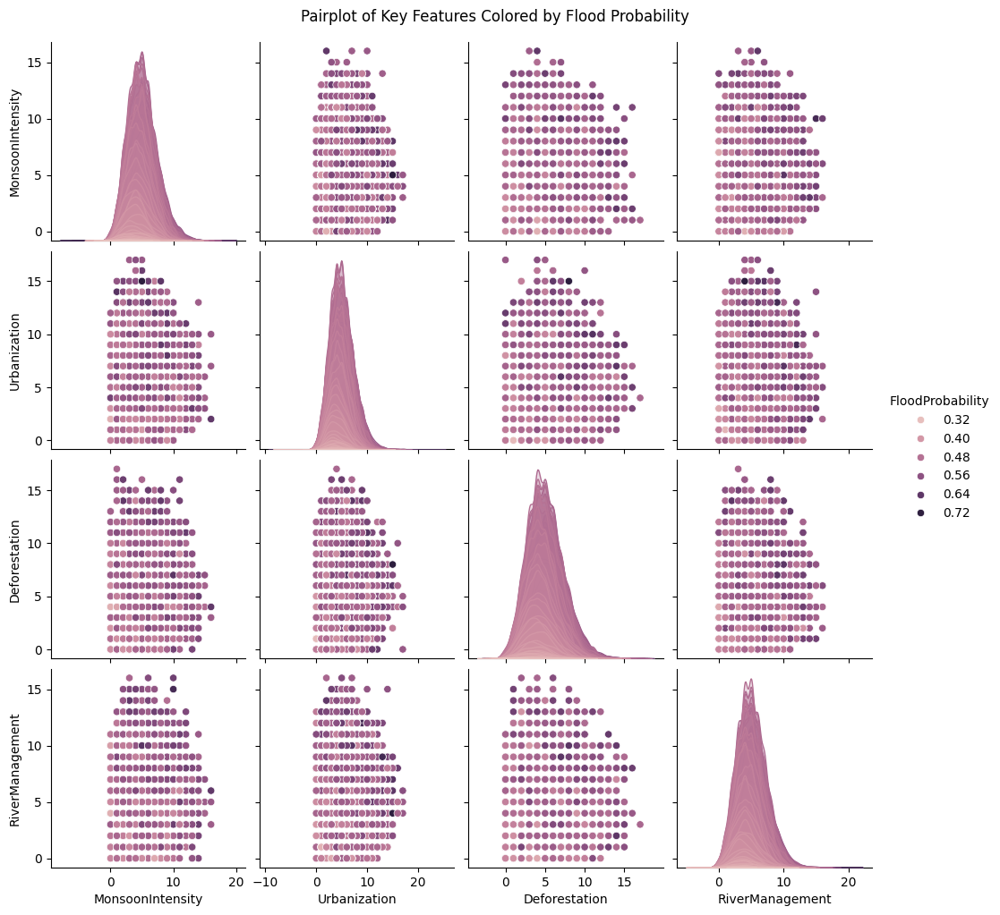

In [ ]:
# Correlation Heatmap for Flood Data

plt.figure(figsize=(12,8))
corr = flood_data.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap of Flood Data Features")
plt.show()

# Pairplot for selected important features
selected_cols = ["MonsoonIntensity", "Urbanization", "Deforestation", "RiverManagement", "FloodProbability"]

sns.pairplot(flood_data[selected_cols], hue="FloodProbability", diag_kind="kde")
plt.suptitle("Pairplot of Key Features Colored by Flood Probability", y=1.02)
plt.show()


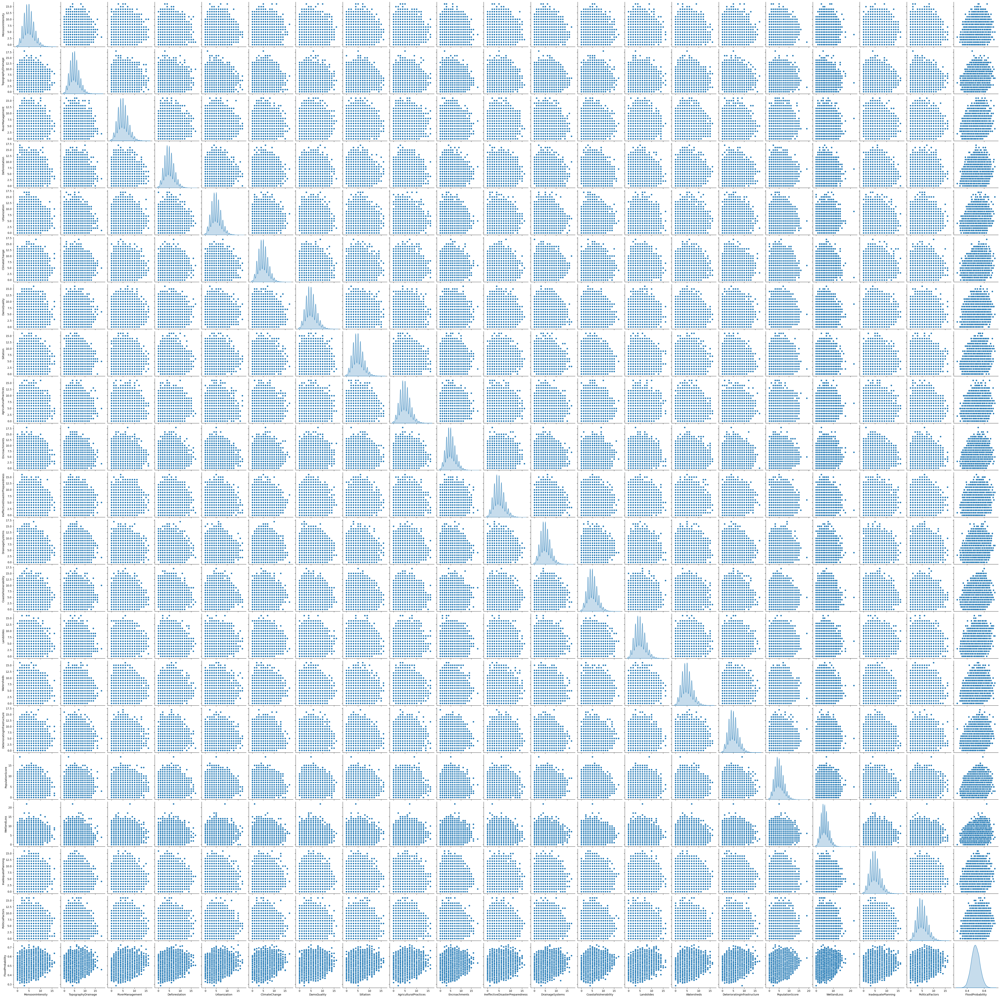

In [ ]:
# Pairplot for Flood Data
sns.pairplot(flood_data, diag_kind="kde")
plt.show()


Census Data Shape: (640, 118)
Census Data Columns: Index(['District code', 'State name', 'District name', 'Population', 'Male',
       'Female', 'Literate', 'Male_Literate', 'Female_Literate', 'SC',
       ...
       'Power_Parity_Rs_90000_150000', 'Power_Parity_Rs_45000_150000',
       'Power_Parity_Rs_150000_240000', 'Power_Parity_Rs_240000_330000',
       'Power_Parity_Rs_150000_330000', 'Power_Parity_Rs_330000_425000',
       'Power_Parity_Rs_425000_545000', 'Power_Parity_Rs_330000_545000',
       'Power_Parity_Above_Rs_545000', 'Total_Power_Parity'],
      dtype='object', length=118)


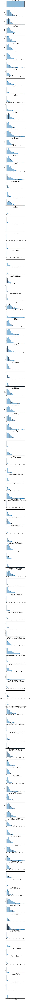

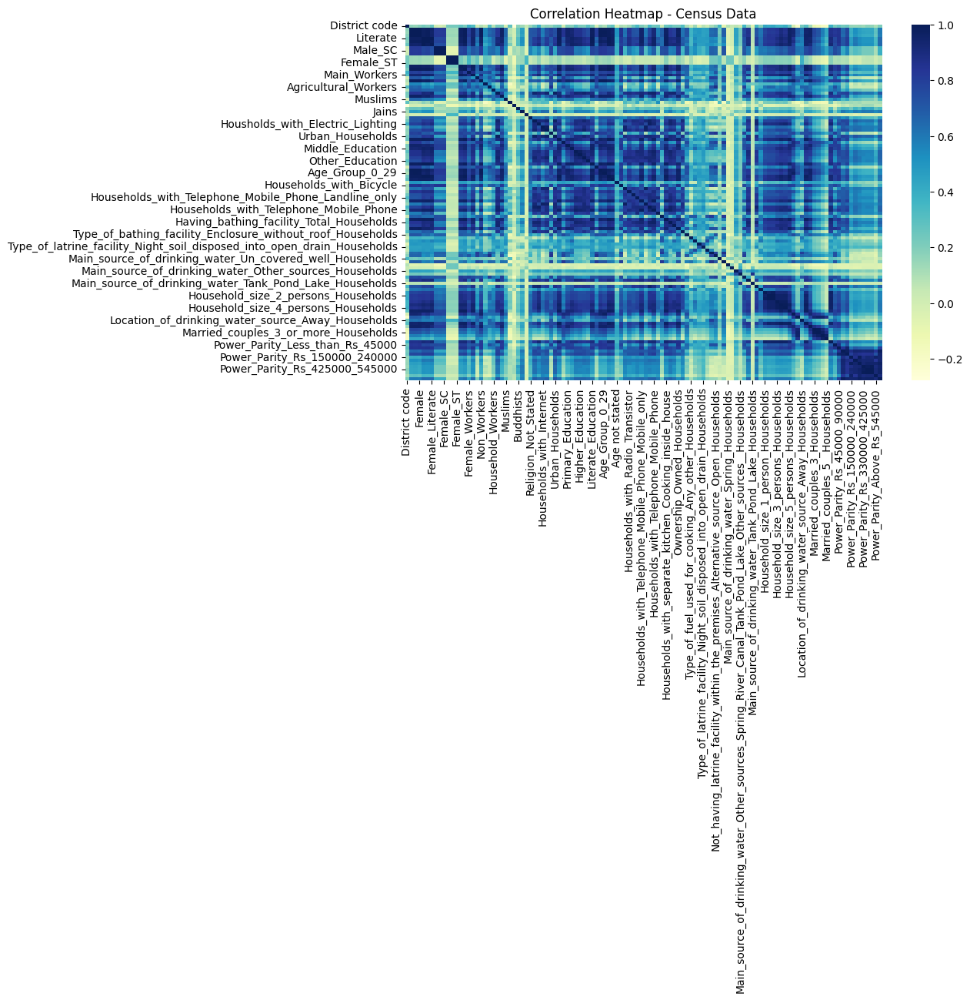

In [ ]:
# Shape & Columns
print("Census Data Shape:", census_data.shape)
print("Census Data Columns:", census_data.columns)

# Histograms for numeric features
num_cols_census = census_data.select_dtypes(include=np.number).columns
fig, axes = plt.subplots(len(num_cols_census), 1, figsize=(8, len(num_cols_census)*3))
for ax, col in zip(axes, num_cols_census):
    sns.histplot(census_data[col], kde=True, ax=ax)
    ax.set_title(f"Distribution of {col}")
plt.tight_layout()
plt.show()

# Correlation heatmap
plt.figure(figsize=(10,6))
# Select only numeric columns for correlation calculation
census_numeric = census_data.select_dtypes(include=np.number)
sns.heatmap(census_numeric.corr(), annot=False, cmap="YlGnBu")
plt.title("Correlation Heatmap - Census Data")
plt.show()

In [ ]:
# Features and target
X = flood_data.drop(target_col, axis=1)
y = flood_data[target_col]

# Correlation with target
corr_with_target = flood_data.corr()[target_col].sort_values(ascending=False)
print("Correlation with Flood Probability:\n", corr_with_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
print("Scaling done. X_train_scaled shape:", X_train_scaled.shape)


Correlation with Flood Probability:
 FloodProbability                   1.000000
DeterioratingInfrastructure        0.229444
TopographyDrainage                 0.229414
RiverManagement                    0.228917
Watersheds                         0.228152
DamsQuality                        0.227467
PopulationScore                    0.226928
Siltation                          0.226544
IneffectiveDisasterPreparedness    0.225126
PoliticalFactors                   0.225009
MonsoonIntensity                   0.224081
WetlandLoss                        0.223732
InadequatePlanning                 0.223329
Landslides                         0.222991
AgriculturalPractices              0.221846
ClimateChange                      0.220986
Urbanization                       0.220867
Deforestation                      0.220237
Encroachments                      0.218259
DrainageSystems                    0.217895
CoastalVulnerability               0.215187
Name: FloodProbability, dtype: float64


# Week 3: Final Submission and Model Deployment

In [4]:
# ============================================================
# WEEK 3 - PART 0: Load Flood Dataset
# ============================================================

import pandas as pd

# Load flood dataset
df_flood = pd.read_csv("flood.csv")

print("Flood Data Shape:", df_flood.shape)
print("Flood Data Columns:", df_flood.columns.tolist())
df_flood.head()


Flood Data Shape: (50000, 21)
Flood Data Columns: ['MonsoonIntensity', 'TopographyDrainage', 'RiverManagement', 'Deforestation', 'Urbanization', 'ClimateChange', 'DamsQuality', 'Siltation', 'AgriculturalPractices', 'Encroachments', 'IneffectiveDisasterPreparedness', 'DrainageSystems', 'CoastalVulnerability', 'Landslides', 'Watersheds', 'DeterioratingInfrastructure', 'PopulationScore', 'WetlandLoss', 'InadequatePlanning', 'PoliticalFactors', 'FloodProbability']


,MonsoonIntensity,TopographyDrainage,RiverManagement,Deforestation,Urbanization,ClimateChange,DamsQuality,Siltation,AgriculturalPractices,Encroachments,...,DrainageSystems,CoastalVulnerability,Landslides,Watersheds,DeterioratingInfrastructure,PopulationScore,WetlandLoss,InadequatePlanning,PoliticalFactors,FloodProbability
0,3,8,6,6,4,4,6,2,3,2,...,10,7,4,2,3,4,3,2,6,0.450
1,8,4,5,7,7,9,1,5,5,4,...,9,2,6,2,1,1,9,1,3,0.475
2,3,10,4,1,7,5,4,7,4,9,...,7,4,4,8,6,1,8,3,6,0.515
3,4,4,2,7,3,4,1,4,6,4,...,4,2,6,6,8,8,6,6,10,0.520
4,3,7,5,2,5,8,5,2,7,5,...,7,6,5,3,3,4,4,3,4,0.475


In [6]:
# ============================================
# Part 1: Flood Prediction Model (Classification)
# ============================================

# --- Import Required Libraries ---
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import joblib

# --- Load Flood Data ---
flood_data = pd.read_csv("flood.csv")

# --- Features (X) and Target (y) ---
X_flood = flood_data.drop("FloodProbability", axis=1)
y_flood_cont = flood_data["FloodProbability"]

# --- Discretize continuous target into categories ---
y_flood = pd.cut(
    y_flood_cont,
    bins=[0, 0.25, 0.5, 0.75, 1.0],   # Example bins
    labels=[0, 1, 2, 3],              # Labels for bins
    include_lowest=True
).astype(int)

# --- Encode categorical features in X (if any) ---
for column in X_flood.columns:
    if X_flood[column].dtype == 'object':
        le = LabelEncoder()
        X_flood[column] = le.fit_transform(X_flood[column])

# --- Train-Test Split with Stratification ---
X_train, X_test, y_train, y_test = train_test_split(
    X_flood, y_flood, test_size=0.2, random_state=42, stratify=y_flood
)

# --- Feature Scaling ---
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# --- Model Training ---
flood_model = RandomForestClassifier(n_estimators=100, random_state=42)
flood_model.fit(X_train_scaled, y_train)

# --- Predictions ---
y_pred_flood = flood_model.predict(X_test_scaled)

# --- Evaluation ---
print("=== Flood Prediction Model (Classification with Stratified Split) ===")
print("Accuracy:", accuracy_score(y_test, y_pred_flood))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_flood))
print("\nClassification Report:\n", classification_report(y_test, y_pred_flood))

# --- Save Model ---
joblib.dump(flood_model, "flood_model.pkl")
print("Model saved as flood_model.pkl")


=== Flood Prediction Model (Classification with Stratified Split) ===
Accuracy: 0.8958

Confusion Matrix:
 [[4923  378]
 [ 664 4035]]

Classification Report:
               precision    recall  f1-score   support

           1       0.88      0.93      0.90      5301
           2       0.91      0.86      0.89      4699

    accuracy                           0.90     10000
   macro avg       0.90      0.89      0.89     10000
weighted avg       0.90      0.90      0.90     10000

Model saved as flood_model.pkl


In [3]:
# ============================================
# Part 2: Disaster Messages Classification
# ============================================

# --- Import Required Libraries ---
import pandas as pd
import numpy as np
import re
import nltk
import pickle
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report

# Download necessary NLTK data (run once)
nltk.download("punkt")
nltk.download("punkt_tab")
nltk.download("stopwords")
nltk.download("wordnet")

# --- Load Data ---
messages = pd.read_csv("disaster_messages.csv")
categories = pd.read_csv("disaster_categories.csv")

# --- Merge datasets ---
df_messages = messages.merge(categories, on="id")

# --- Split category columns ---
categories_expanded = df_messages["categories"].str.split(";", expand=True)
row = categories_expanded.iloc[0]
category_colnames = row.apply(lambda x: x.split("-")[0])
categories_expanded.columns = category_colnames

for column in categories_expanded:
    categories_expanded[column] = categories_expanded[column].str.split("-").str[1].astype(int)

df_messages_final = pd.concat([df_messages.drop("categories", axis=1), categories_expanded], axis=1)

# --- Define features (X) and target (y) ---
X_messages = df_messages_final["message"]
y_messages = df_messages_final.iloc[:, 4:]  # All category columns

# --- Train-test split ---
X_train_msg, X_test_msg, y_train_msg, y_test_msg = train_test_split(
    X_messages, y_messages, test_size=0.2, random_state=42
)

# --- Text Preprocessing Function ---
def tokenize(text):
    text = re.sub(r"[^a-zA-Z0-9]", " ", text.lower())  # clean text
    tokens = nltk.word_tokenize(text)  # tokenize
    lemmatizer = WordNetLemmatizer()
    clean_tokens = [
        lemmatizer.lemmatize(w) for w in tokens if w not in stopwords.words("english")
    ]
    return clean_tokens

# --- Build ML Pipeline ---
pipeline = Pipeline([
    ("tfidf", TfidfVectorizer(tokenizer=tokenize)),
    ("clf", MultiOutputClassifier(RandomForestClassifier(n_estimators=100, random_state=42)))
])

# --- Train the Model ---
pipeline.fit(X_train_msg, y_train_msg)

# --- Predictions ---
y_pred_msg = pipeline.predict(X_test_msg)

# --- Evaluation ---
for i, col in enumerate(y_messages.columns):
    print(f"\nReport for: {col}")
    print(classification_report(y_test_msg.iloc[:, i], y_pred_msg[:, i]))

print("\nModel training complete ✅")

# --- Save the trained model ---
with open("messages_model.pkl", "wb") as f:
    pickle.dump(pipeline, f)

print("Model saved as messages_model.pkl")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(



Report for: related
              precision    recall  f1-score   support

           0       0.73      0.43      0.54      1216
           1       0.85      0.95      0.89      4021
           2       0.35      0.46      0.40        41

    accuracy                           0.82      5278
   macro avg       0.64      0.61      0.61      5278
weighted avg       0.81      0.82      0.81      5278


Report for: request
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      4353
           1       0.84      0.51      0.64       925

    accuracy                           0.90      5278
   macro avg       0.87      0.75      0.79      5278
weighted avg       0.89      0.90      0.89      5278


Report for: offer
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5255
           1       1.00      0.04      0.08        23

    accuracy                           1.00      5278
   macro avg 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      4989
           1       0.71      0.03      0.07       289

    accuracy                           0.95      5278
   macro avg       0.83      0.52      0.52      5278
weighted avg       0.93      0.95      0.92      5278


Report for: direct_report
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      4249
           1       0.79      0.38      0.51      1029

    accuracy                           0.86      5278
   macro avg       0.83      0.68      0.71      5278
weighted avg       0.85      0.86      0.84      5278


Model training complete ✅
Model saved as messages_model.pkl


In [12]:
# ============================================
# Part 3: ResQRelief MVP Demo
# ============================================

# --- Import Required Libraries for Demo ---
import pandas as pd
import numpy as np

# --- Demo Function 1: Predict Message Categories ---
def classify_message(model, text):
    print(f"\nAnalyzing message: '{text}'")

    # We'll assume y_messages is available from Part 2
    # If not, you'd load the column names from a file
    global y_messages

    prediction = model.predict([text])

    # Get the names of the predicted categories
    predicted_categories = y_messages.columns[(prediction[0] == 1)].tolist()

    if predicted_categories:
        print("Predicted Categories:", ", ".join(predicted_categories))
    else:
        print("No specific categories predicted for this message.")

# --- Demo Function 2: Predict Flood Probability ---
# This function will take new flood-related inputs and predict flood probability
def predict_flood_risk(model, scaler, input_data, X_train_cols):
    input_df = pd.DataFrame([input_data], columns=X_train_cols.columns)

    # Scale the input using the provided scaler
    input_scaled = scaler.transform(input_df)

    # Predict using the loaded model
    prediction = model.predict(input_scaled)

    # Interpret the prediction
    if prediction[0] == 0:
        return "Low"
    elif prediction[0] == 1:
        return "Medium"
    elif prediction[0] == 2:
        return "High"
    else:
        return "Very High"

# --- Run the Demos ---
print("\n--- Running ResQRelief Demos ---")

# Demo 1: Classify a sample message using the pipeline from Part 2
# The 'pipeline' variable must be defined from running Part 2
try:
    classify_message(pipeline, "Urgent! We need food, water, and medical supplies for the survivors.")
except NameError:
    print("Error: The message classification model is not defined. Please run Part 2 first.")

# Demo 2: Predict flood risk for sample conditions
# The 'flood_model', 'scaler', and 'X_train' variables must be defined from Part 1.
try:
    # A sample list of features. The number and order must match your training data.
    sample_flood_features = X_train.iloc[0].values.tolist()

    predicted_risk = predict_flood_risk(
        flood_model,
        scaler,
        sample_flood_features,
        X_train
    )
    print(f"\nBased on the input features, the predicted flood risk is: {predicted_risk}")
except NameError:
    print("\nError: The flood prediction model is not defined. Please run Part 1 first.")


--- Running ResQRelief Demos ---

Analyzing message: 'Urgent! We need food, water, and medical supplies for the survivors.'
Predicted Categories: related, request, aid_related, water, food, direct_report

Based on the input features, the predicted flood risk is: High
